### Import Libraries

In [1]:
import numpy
from matplotlib import pyplot
import matplotlib.cm as cm
%matplotlib inline
#
from matplotlib import animation
from JSAnimation.IPython_display import display_animation

### Parameters

In [2]:
#gridpoints in x and y directions:
n = 192
#----------------------------------
#Rates of diffusion:
Du, Dv = 0.00016, 0.00008
# feed and kill rates:
F, k = 0.035, 0.065 
#----------------------------------
# dh=dx=dy
dh = 5./(n-1)
#----------------------------------
#Terminal time (sec):
T = 8000
# time step and number of time steps:
dt = .9 * dh**2 / (4*max(Du,Dv))
nt = int(T/dt)

In [3]:
print(nt)

8301


In [4]:
print(dt)

0.9636865765741071


In [5]:
dh

0.02617801047120419

### Initial Condition from File

In [6]:
uvinitial = numpy.load('uvinitial.npz')
U_initial = uvinitial['U']
V_initial = uvinitial['V']

In [7]:
numpy.shape(U_initial)

(192, 192)

In [8]:
type(U_initial)

numpy.ndarray

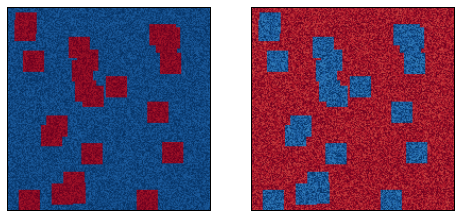

In [9]:
fig = pyplot.figure(figsize=(8,5))
pyplot.subplot(121)
pyplot.imshow(U_initial, cmap = cm.RdBu)
pyplot.xticks([]), pyplot.yticks([]);
pyplot.subplot(122)
pyplot.imshow(V_initial, cmap = cm.RdBu)
pyplot.xticks([]), pyplot.yticks([]);

### Note on Boundary Conditions

Use zero Neumann boundary conditions on all sides of the domain!!

$\frac{\partial U}{\partial y} =\frac{\partial V}{\partial y} = q_{y} = 0, and$

$\frac{\partial U}{\partial x} = \frac{\partial V}{\partial x} =q_{x} = 0$

### Discretize Equation: Forward in space, backward in time

In [10]:
def ftcs(U_init, V_init, delta, dv, du, delt, n_grid, numt):
    """
    Parameters:
    -----------
    U_init - initial conditions array for chemical species U
    V_init - initial conditions array for chemical species V
    delta - spacing (both for dx and dt, since they are equal in this problem)
    dv - V rate of diffusion
    du - U rate of diffusion
    delt - time spacing (dt)
    n_grid - number of gridpoints (same in x and y direction)
    numt - number of time steps
    
    Note on array: Un and Vn follow: [time_step, x_coord, y_coord]
    Note on indexing: [1:-1] goes from second index to second last (in this case from 1 to 190)
                      [:-2] goes from first index to third last (in this case from 0 to 189)
                      [2:] goes from third index to last (in this case from 2 to 191)
    """
    #
    U = numpy.zeros_like(U_init)
    V = numpy.zeros_like(V_init)
    U = U_init.copy()
    V = V_init.copy()
    #
    Un = numpy.zeros((numt+1, n_grid, n_grid))
    Vn = numpy.zeros((numt+1, n_grid, n_grid))
    Un[0,:,:] = U_init.copy()
    Vn[0,:,:] = V_init.copy()
    #
    for t in range(1,numt+1):
        #Interior points
        Un[t,1:-1,1:-1] = U[1:-1,1:-1] + (delt*du/(delta**2))*\
                         ((U[2:,1:-1] - 2*U[1:-1,1:-1] + U[:-2,1:-1]) + (U[1:-1,2:] - 2*U[1:-1,1:-1] + U[1:-1,:-2]) )-\
                          delt*U[1:-1,1:-1]*(V[1:-1,1:-1]**2) + delt*F*(1-U[1:-1,1:-1])

        #    
        Vn[t,1:-1,1:-1] = V[1:-1,1:-1] + (delt*dv/(delta**2))*\
                         ((V[2:,1:-1] - 2*V[1:-1,1:-1] + V[:-2,1:-1]) + (V[1:-1,2:] - 2*V[1:-1,1:-1] + V[1:-1,:-2]))+\
                          delt*U[1:-1,1:-1]*(V[1:-1,1:-1]**2) - delt*V[1:-1,1:-1]*(F+k)
        #
        #Neumann BCS:
        Un[t,0,:] = Un[t,1,:]
        Vn[t,0,:] = Vn[t,1,:]
        Un[t,-1,:] = Un[t,-2,:]
        Vn[t,-1,:] = Vn[t,-2,:]
        #
        Un[t,:,0] = Un[t,:,1]
        Vn[t,:,0] = Vn[t,:,1]
        Un[t,:,-1] = Un[t,:,-2]
        Vn[t,:,-1] = Vn[t,:,-2]
        #
        #Copy for updating time step:
        U = Un[t,:,:].copy()
        V = Vn[t,:,:].copy()
        
    return Un[:,:,:], Vn[:,:,:]

In [11]:
# ftcs(U_init, Vinit, delta, dv, du, delt, n_grid, numt):
UN, VN = ftcs(U_initial, V_initial, dh, Dv, Du, dt, n, nt )

In [12]:
numpy.shape(UN)

(8302, 192, 192)

In [13]:
t = numpy.linspace(0,8000,nt+1)

In [14]:
numpy.where(t==8000)

(array([8301]),)

In [15]:
numpy.round(UN[8301,100,::40],4)

array([ 0.9247,  0.8501,  0.6682,  0.902 ,  0.904 ])

### Animate

In [16]:
import matplotlib.animation as animation

#### I commented out the animation to reduce the file size

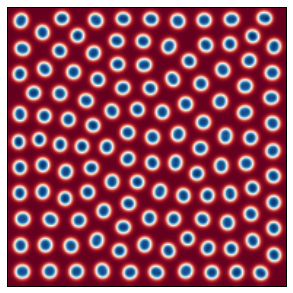

In [17]:
fig = pyplot.figure(figsize=(8,5))

ims = []

for i in range(0,8301,100):
    im = pyplot.imshow(VN[i,:,:], cmap = cm.RdBu)
    pyplot.xticks([]), pyplot.yticks([])
    ims.append([im])



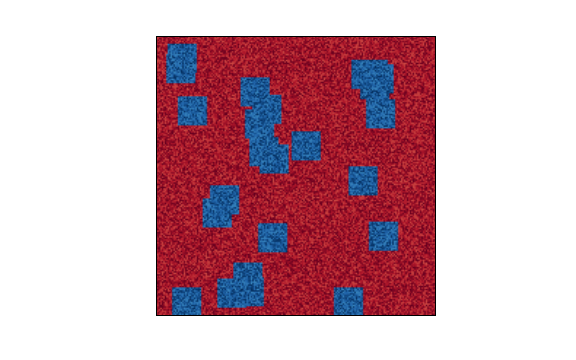
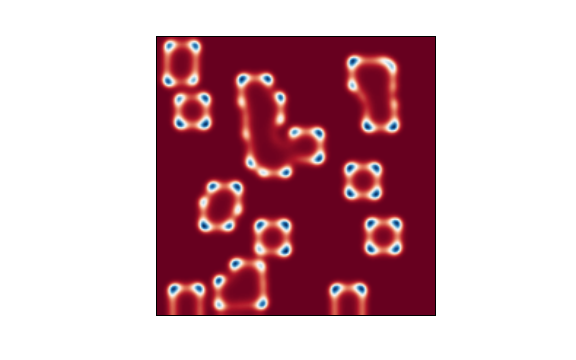
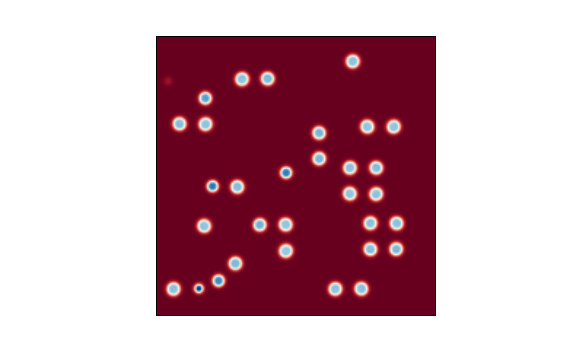
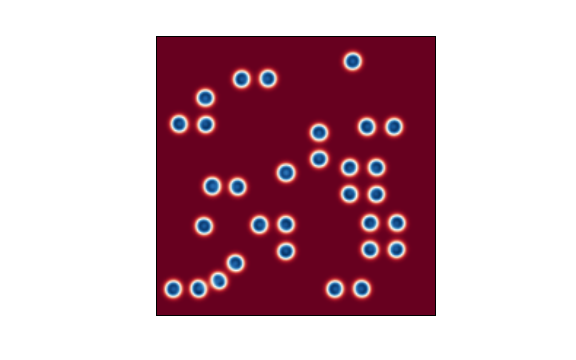
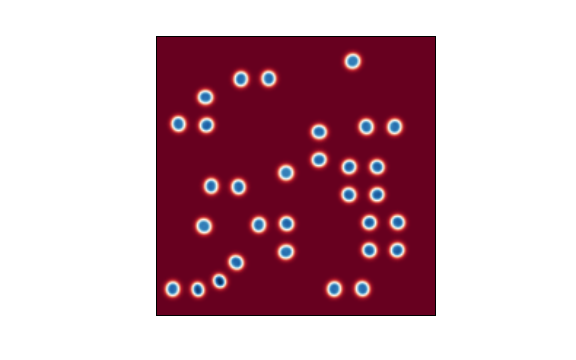
...
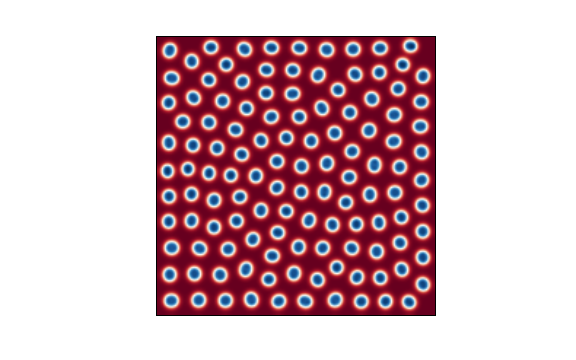
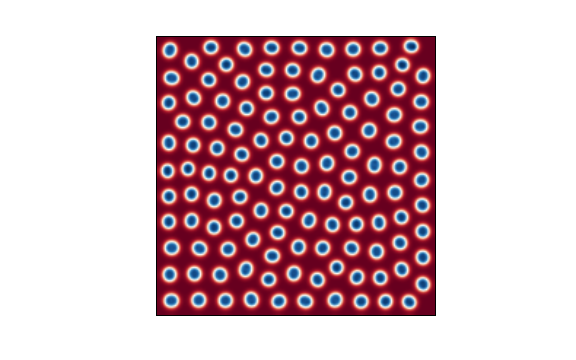
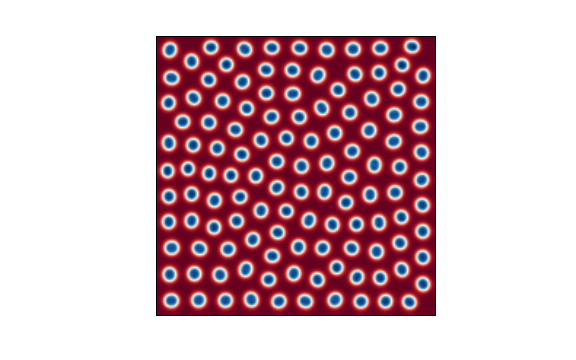
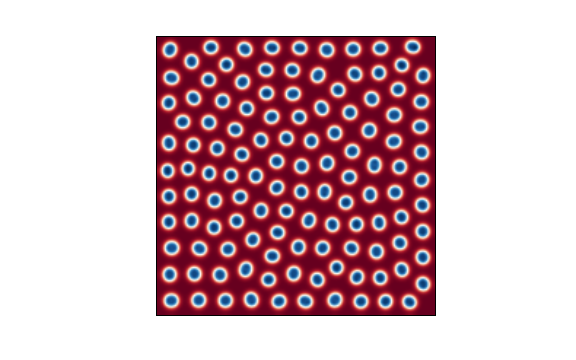
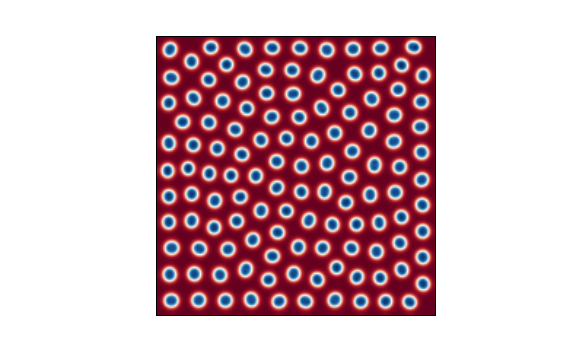

In [18]:
ani = animation.ArtistAnimation(fig, ims)
display_animation(ani, default_mode='once')

### Note that the animation for UN is similar